In [1]:
import sys 
!{sys.executable} -m pip install --user yacs

You should consider upgrading via the '/usr/local/bin/python -m pip install --upgrade pip' command.


In [2]:
import cv2
import math
import numpy as np
import matplotlib.pyplot as plt

from utils_inference import get_lmks_by_img, get_model_by_name, get_preds, decode_preds, crop, detect_direction
from utils_landmarks import show_landmarks, get_five_landmarks_from_net, alignment_orig, get_six_landmarks_from_net

In [3]:
import os
from os.path import join as ospj

path = "./images/SHW"
file_list = os.listdir(path)
img_paths = [file for file in file_list if file.endswith(".JPG")]
print(img_paths)

['DSC_3575.JPG', 'DSC_3581.JPG', 'DSC_3567.JPG', 'DSC_3550.JPG', 'DSC_3574.JPG', 'DSC_3568.JPG', 'DSC_3551.JPG', 'DSC_3561.JPG', 'DSC_3571.JPG', 'DSC_3560.JPG', 'DSC_3570.JPG', 'DSC_3549.JPG', 'DSC_3555.JPG', 'DSC_3566.JPG', 'DSC_3552.JPG', 'DSC_3576.JPG', 'DSC_3554.JPG', 'DSC_3584.JPG', 'DSC_3580.JPG', 'DSC_3564.JPG', 'DSC_3569.JPG', 'DSC_3586.JPG', 'DSC_3572.JPG', 'DSC_3557.JPG', 'DSC_3578.JPG', 'DSC_3589.JPG', 'DSC_3548.JPG', 'DSC_3556.JPG', 'DSC_3577.JPG', 'DSC_3563.JPG', 'DSC_3582.JPG', 'DSC_3565.JPG', 'DSC_3579.JPG', 'DSC_3573.JPG', 'DSC_3547.JPG', 'DSC_3588.JPG', 'DSC_3558.JPG', 'DSC_3553.JPG', 'DSC_3583.JPG']


In [4]:
def Area(corners):
    n = len(corners) # of corners
    area = 0.0
    for i in range(n):
        j = (i + 1) % n
        area += corners[i][0] * corners[j][1]
        area -= corners[j][0] * corners[i][1]
    area = abs(area) / 2.0
    return area

def calc_area(img):
    lmks = img['lmks']
    left_eye  = lmks[0]
    right_eye = lmks[1]
    nose      = lmks[2]
    left_lip  = lmks[3]
    right_lip = lmks[4]
    
    return Area([nose, left_eye, right_eye]), Area([nose, left_lip, right_lip])

In [5]:
def get_lmks_with_dicts(model, img_paths):
    i = 0
    imgs_dict={}
    for img_path in img_paths:
        i +=1
        print(i)
        img_dict = {}
        img = cv2.imread(ospj(path,img_path))
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        img_dict['img'] = img
        img_dict['width'] = img.shape[1]
        img_dict['height'] = img.shape[0]

        lmks = get_lmks_by_img(model, img) 
        five_lmks = get_five_landmarks_from_net(lmks)
        img_dict['lmks'] = five_lmks
        img_dict['top_area'], img_dict['bottom_area'] = calc_area(img_dict)


        left_eye  = five_lmks[0]
        right_eye = five_lmks[1]
        nose      = five_lmks[2]
        left_lip  = five_lmks[3]
        right_lip = five_lmks[4]

        img_dict["direction"] = detect_direction(five_lmks, img.shape[1])
        img_dict["eye2eye"] = abs(left_eye[0] - right_eye[0])
        img_dict["eye2lip"] = abs((left_eye[1]+right_eye[1])/2 - (left_lip[1]+right_lip[1])/2)
        img_dict["lip2lip"] = abs(left_lip[0] - right_lip[0])
        imgs_dict[img_path] = img_dict
    return imgs_dict

In [6]:
def sort_imgs_to_set(img_dicts):
    landscape_d = {}
    zoom_in_d ={}
    zoom_out_d = {}
    # landscape
    # ready to split btw zoom_in & zoom_out
    distance_btw_lips = []
    distance_btw_eye2lip = []
    for k in imgs_dict.keys():
        width = imgs_dict[k]['width']
        height = imgs_dict[k]['height']
        lmks = imgs_dict[k]['lmks']

        if width > height:
            landscape_d[k] = imgs_dict[k]
        else:
            left_eye = lmks[0]
            right_eye = lmks[1]
            left_lip = lmks[3]
            right_lip = lmks[4]
            distance_btw_lips.append(imgs_dict[k]["lip2lip"])
            distance_btw_eye2lip.append(imgs_dict[k]["eye2lip"])
   
    import matplotlib.pyplot as plt
    bound_w = plt.hist(distance_btw_lips, bins=2)
    bound_h = plt.hist(distance_btw_eye2lip, bins=2)
    half_w = bound_w[1][1]
    half_h = bound_h[1][1]
    
    #zoom_in / zoom_out
    for k in imgs_dict.keys():
        width = imgs_dict[k]['width']
        height = imgs_dict[k]['height']
        lmks = imgs_dict[k]['lmks']

        left_eye  = lmks[0]
        right_eye = lmks[1]
        left_lip  = lmks[3]
        right_lip = lmks[4]

        if width < height:
            btw_lips = abs(left_lip[0] - right_lip[0])
            btw_eye2lip = abs((left_lip[1]+right_lip[1])/2 - (left_eye[1]+right_eye[1])/2)
            if btw_lips > half_w or btw_eye2lip > half_h:
                zoom_in_d[k] = imgs_dict[k]
            else:
                zoom_out_d[k] = imgs_dict[k]
    return landscape_d, zoom_in_d, zoom_out_d

In [7]:
def sort_set_to_dirtype(target_d):
    print(target_d.keys())
    h_d = {}
    v_d = {}
    o_d = {}
    _temp_l = []
    for k in target_d.keys():
        target = target_d[k]
        direction = target["direction"]
        if direction != 2:
            h_d[k] = target_d[k]
        else:  
            lmks = target_d[k]['lmks']
            left_eye  = lmks[0]
            right_eye = lmks[1]
            nose      = lmks[2]
            left_lip  = lmks[3]
            right_lip = lmks[4]

            _temp_l.append(abs(1-abs((left_eye[1]+right_eye[1])/2 - nose[1])/abs((left_lip[1]+right_lip[1])/2 -nose[1])))

    boundary = plt.hist(_temp_l, bins=2)[1][1]

    for k in target_d.keys():
        target = target_d[k]
        direction = target["direction"]
        if direction == 2:
            lmks = target_d[k]['lmks']
            left_eye  = lmks[0]
            right_eye = lmks[1]
            nose      = lmks[2]
            left_lip  = lmks[3]
            right_lip = lmks[4]
            updown_ratio = abs(1-abs((left_eye[1]+right_eye[1])/2 - nose[1])/abs((left_lip[1]+right_lip[1])/2 - nose[1]))
            if updown_ratio < boundary :
                o_d[k] = target_d[k]
            else:
                v_d[k] = target_d[k]
   
    target_split_d = {}          
    target_split_d["origin"] = o_d
    target_split_d["horizontal"] = h_d
    target_split_d["vertical"] = v_d
    return target_split_d

In [8]:
def sort_all_sets_to_dirtype(landscape_d, zoom_in_d, zoom_out_d):
    landscape = sort_set_to_dirtype(landscape_d)
    zoom_in   = sort_set_to_dirtype(zoom_in_d)
    zoom_out  = sort_set_to_dirtype(zoom_out_d)
    return landscape, zoom_in, zoom_out

In [9]:
#########################
#rotate and shift
#########################

In [10]:
# landscape는 nose to center 정렬 안함
# zoom_in/zoom_out 은 origin으로 nose_to_center

In [11]:
def set_scale_ref_img(target_dicts):
    def find_max_length(target_dicts):
        max_length = 0
        ref_img = 0
        for k in target_dicts["origin"].keys():
            target = target_dicts["origin"][k]
            length = target["eye2lip"]
            if max_length < length:
                max_length = length
                ref_img = k
        return ref_img
    
    def find_min_length(target_dicts):
        min_length = 100000000
        ref_img = 0
        for k in target_dicts["origin"].keys():
            target = target_dicts["origin"][k]
            length = target["eye2lip"]
            if min_length > length:
                min_length = length
                ref_img = k
        return ref_img
    
    
    ref_key = find_max_length(target_dicts)
    target_dicts["ref_scale_ori"] = ref_key
    print("ref_key %s" % ref_key)
    for dir_type in ["origin", "horizontal", "vertical"]:
        print("=========dir_type=========")
        print("%s" % dir_type)
        for k in target_dicts[dir_type].keys():
            target = target_dicts[dir_type][k]
            lmks = target["lmks"]
            width = target["width"]
            height = target["height"]
            
            if dir_type == "vertical":
                ref_where = "lip2lip"
            else:
                ref_where = "eye2lip"
                
            scale = target_dicts["origin"][ref_key][ref_where]/target[ref_where]
            scale = 1.0
            scaled_img = cv2.resize(target["img"], dsize=(int(width*scale), int(height*scale)), interpolation=cv2.INTER_CUBIC)
            target["scale"] = scale
            target["crop_img"] = scaled_img
            #print(k)
            #print(target[ref_where])
            #print(scale)
            #plt.figure(figsize=(10,8))
            #plt.imshow(scaled_img)
            #plt.show()

In [12]:
def shift_to_boardcenter(target_dict):
    board_w, board_h = None, None
    for k in target_dict.keys():
        target = target_dict[k]
        
        if board_w is None:
            board_w = target["width"]*3//2
            board_h = target["height"]*3//2
            
        shift_w = (board_w - target["width"])//2
        shift_h = (board_h - target["height"])//2
        
        T = [ [1, 0, shift_w],
             [0, 1, shift_h] 
            ]
        T = np.float32(T)
        transformed_img = cv2.warpAffine(target["img"], T, (board_w, board_h))
        target["crop_img"] = transformed_img
    return board_w, board_h

In [13]:
def shift_to_boardcenter_all(target_dicts):
    board_h, board_w = shift_to_boardcenter(target_dicts["origin"])
    board_h, board_w = shift_to_boardcenter(target_dicts["horizontal"])
    board_h, board_w = shift_to_boardcenter(target_dicts["vertical"])
    return board_h, board_w

In [14]:
def set_ref_points(lmks, align_where):
    eye = (lmks[0] + lmks[1])/2
    nose = lmks[2]
    lip = (lmks[3] + lmks[4])/2
    
  
    if align_where == "eye":
        ratio_a, ratio_b = 1, 2
        return eye/(ratio_a+ratio_b)*(ratio_b) + nose/(ratio_a+ratio_b)*(ratio_a)
    elif align_where == "nose":
        ratio_a, ratio_b = 2, -1
        return eye/(ratio_a+ratio_b)*(ratio_b) + nose/(ratio_a+ratio_b)*(ratio_a)
    '''
    elif align_where == "chin":
        ratio_a, ratio_b = 1, 1
        return eye/(ratio_a+ratio_b)*(ratio_b) + chin/(ratio_a+ratio_b)*(ratio_a)
    '''

In [15]:
def set_ref_img(target_dicts, align_where):
    max_shift_w = 0
    max_shift_h = 0
    
    dir_type = "origin"
    for k in target_dicts[dir_type].keys():
        target = target_dicts[dir_type][k]
        lmks = target_dicts[dir_type][k]["lmks"]
        eye = (lmks[0] + lmks[1])/2
        nose = lmks[2]
        lip = (lmks[3] + lmks[4])/2

        ref_points = set_ref_points(lmks, align_where)
        shift_w = target['width']/2 - ref_points[0]
        shift_h = target['height']/2 - ref_points[1]

        if abs(max_shift_w) < abs(shift_w):
            max_shift_w = shift_w
            ref_img = k
        if abs(max_shift_h) < abs(shift_h):
            max_shift_h = shift_h
            ref_img = k
        


    target_dicts["shift_w"] = max_shift_w
    target_dicts["shift_h"] = max_shift_h
    target_dicts["ref_ori"] = ref_img


In [16]:
def align_each(target_dicts, dir_type, align_where):
    board_w = target_dicts["board_w"]
    board_h = target_dicts["board_h"]
    ref_ori = target_dicts["ref_ori"]
    ref_scale = target_dicts["origin"][ref_ori]["scale"]
    ref_lmks  = ref_scale * target_dicts["origin"][ref_ori]["lmks"]
    ref_width = ref_scale * target_dicts["origin"][ref_ori]["width"]
    ref_height = ref_scale * target_dicts["origin"][ref_ori]["height"]
    
    ref_shift_w = target_dicts["shift_w"]
    ref_shift_h = target_dicts["shift_h"]
    
    crop_shift_w = 0
    crop_shift_h = 0
    
    ref_key = 0
    for k in target_dicts[dir_type].keys():
        target = target_dicts[dir_type][k]
        
        scale = target["scale"]
        width = scale * target["width"]
        height = scale * target["height"]
        lmks = scale * target["lmks"]
        eye = (lmks[0] + lmks[1])/2
        nose = lmks[2]
        lip = (lmks[3] + lmks[4])/2
        #chin = lmks[5]
        
        if align_where == "eye":
            ref_where = (ref_lmks[0] + ref_lmks[1])/2
            _align_where = eye
            '''
            if chin[0] is None:
                ref_where = (ref_lmks[0] + ref_lmks[1])/2
                _align_where = eye
            else:
                ref_where = ref_lmks[5]
                _align_where = chin
            ''' 
        elif align_where == "nose":
            ref_where = ref_lmks[2]
            _align_where = nose
        elif align_where == "lip":
            ref_where = (ref_lmks[3] + ref_lmks[4])/2
            _align_where = lip
        #elif align_where == "chin":
        #    ref_where = ref_lmks[5]
        #    _align_where = chin
        else:
            raise ValueError

        if dir_type == "origin":
            _align_where = set_ref_points(lmks, align_where)
            shift_w = width/2 - _align_where[0]
            shift_h = height/2 - _align_where[1]
        elif dir_type == "horizontal":
            shift_w = 0
            shift_h = ref_where[1] + ref_shift_h - _align_where[1] - (ref_height - height)/2
        elif dir_type == "vertical":
            shift_w = ref_where[0] + ref_shift_w - _align_where[0] - (ref_width - width)/2
            shift_h = 0 
        else:
            raise ValueError
        
        #update crop_shift
        if dir_type == "origin":
            if abs(shift_w) > abs(crop_shift_w):
                crop_shift_w = shift_w
                ref_key = k
            if abs(shift_h) > abs(crop_shift_h):
                crop_shift_h = shift_h
                ref_key = k
        elif dir_type == "horizontal":
            if abs(shift_h) > abs(crop_shift_h):
                crop_shift_h = shift_h
                ref_key = k
        elif dir_type == "vertical":
            if abs(shift_w) > abs(crop_shift_w):
                crop_shift_w = shift_w
                ref_key = k

        deg = 0
        if dir_type == "vertical" or dir_type == "origin":
            left_eye = lmks[0]
            right_eye = lmks[1]
            diff_eye2nose = abs(eye-nose)
            direction = np.argmax(diff_eye2nose)

            diff_eye = right_eye - left_eye
            if diff_eye[direction] != 0:
                if direction == 0:
                    deg = -1*diff_eye[1]/diff_eye[0]
                else:
                    deg = diff_eye[0]/diff_eye[1]
            deg = np.arctan(deg)
                
        R = cv2.getRotationMatrix2D((width/2,  height/2), deg, 1)
        T = [ [0, 0, shift_w],
             [0, 0, shift_h] 
            ]
        T = np.float32(T)
        
        
        transformed_img = cv2.warpAffine(target["crop_img"], R+T, (board_w, board_h))
        print(k)
        print(target["scale"])
        
        plt.figure(figsize=(10,8))
        plt.imshow(target["crop_img"])
        plt.show()
        plt.figure(figsize=(10,8))
        plt.imshow(transformed_img)
        plt.show()
        
        if dir_type == "vertical":
            print(ref_where[0])
            print(ref_shift_w)
            print(_align_where[0])

        target["crop_img"] = transformed_img
    
    if "crop_shift_w" in target_dicts.keys():
        if abs(crop_shift_w) > abs(target_dicts["crop_shift_w"]):
            target_dicts["crop_shift_w"] = crop_shift_w
            target_dicts["ref_crop_img"] = ref_key
            target_dicts["ref_crop_dir"] = dir_type
            
        if abs(crop_shift_h) > abs(target_dicts["crop_shift_h"]):
            target_dicts["crop_shift_h"] = crop_shift_h
            target_dicts["ref_crop_img"] = ref_key
            target_dicts["ref_crop_dir"] = dir_type

    else:
        target_dicts["crop_shift_w"] = crop_shift_w
        target_dicts["crop_shift_h"] = crop_shift_h
        target_dicts["ref_crop_img"] = ref_key
        target_dicts["ref_crop_dir"] = dir_type
    

In [17]:
def align(target_dicts, align_where):
    align_each(target_dicts, "origin", align_where)
    align_each(target_dicts, "horizontal", align_where)
    align_each(target_dicts, "vertical", align_where)
    

In [18]:
def crop_each(target_dicts, dir_type):
    ref_crop_shift_w = target_dicts["crop_shift_w"] 
    ref_crop_shift_h = target_dicts["crop_shift_h"] 

    board_w = target_dicts["board_w"]
    board_h = target_dicts["board_h"]

    for k in target_dicts[dir_type].keys():
        target = target_dicts[dir_type][k]
        scale = target['scale']
        width = scale * target['width']
        height = scale * target['height']

        offset_w = width//2 - abs(ref_crop_shift_w)
        offset_h = height//2 - abs(ref_crop_shift_h)
        target["crop_img"] = target["crop_img"][int(board_h//2 - offset_h):int(board_h//2 + offset_h),
                                                int(board_w//2 - offset_w):int(board_w//2 + offset_w)]


In [19]:
def crop(target_dicts):
    crop_each(target_dicts, "origin")
    crop_each(target_dicts, "horizontal")
    crop_each(target_dicts, "vertical")

In [20]:
def edit_all_images(target_dicts, align_where):
    
    set_scale_ref_img(target_dicts)
    #"crop_img" generate
    board_w, board_h = shift_to_boardcenter_all(target_dicts)
    target_dicts["board_w"] = board_w
    target_dicts["board_h"] = board_h
    
    #"shift_w" ,"shift_h", "ref_ori" generate
    set_ref_img(target_dicts, align_where)
    
    # align : update @ "crop_img"
    align(target_dicts, align_where)
    crop(target_dicts)

In [21]:
def debug_image(target_dicts, key, dir_type):
    board_w = target_dicts["board_w"]
    board_h = target_dicts["board_h"]
    ref_ori = target_dicts["ref_ori"]
    ref_lmks = target_dicts["origin"][ref_ori]["lmks"]
    ref_shift_w = target_dicts["shift_w"]
    ref_shift_h = target_dicts["shift_h"]

    crop_shift_w = 0
    crop_shift_h = 0

    target = target_dicts[dir_type][key]

    width = target["width"]
    height = target["height"]
    lmks = target["lmks"]
    eye = (lmks[0] + lmks[1])/2
    nose = lmks[2]
    lip = (lmks[3] + lmks[4])/2

    align_where = "eye"
    if align_where == "eye":
        ref_where = (ref_lmks[0] + ref_lmks[1])/2
        _align_where = eye
    elif align_where == "nose":
        ref_where = ref_lmks[2]
        _align_where = nose
    elif align_where == "lip":
        ref_where = (ref_lmks[3] + ref_lmks[4])/2
        _align_where = lip
    elif align_where == "chin":
        ref_where = ref_lmks[5]
        _align_where = chin
    else:
        raise ValueError

    if dir_type == "origin":
        _align_where = set_ref_points(lmks, align_where)
        shift_w = target['width']/2 - _align_where[0]
        shift_h = target['height']/2 - _align_where[1]
    elif dir_type == "horizontal":
        shift_w = 0
        shift_h = ref_where[1] + ref_shift_h - _align_where[1] 
    elif dir_type == "vertical":
        shift_w = ref_where[0] + ref_shift_w - _align_where[0]
        shift_h = 0 
    else:
        raise ValueError

    deg = 0
    if dir_type == "vertical" or dir_type == "origin":
        left_eye = lmks[0]
        right_eye = lmks[1]
        diff_eye2nose = abs(eye-nose)
        direction = np.argmax(diff_eye2nose)

        diff_eye = right_eye - left_eye
        if diff_eye[direction] != 0:
            if direction == 0:
                deg = -1*diff_eye[1]/diff_eye[0]
            else:
                deg = diff_eye[0]/diff_eye[1]
        deg = np.arctan(deg)

    _shift_w = (board_w - target["width"])//2
    _shift_h = (board_h - target["height"])//2

    T = [ [1, 0, _shift_w],
         [0, 1, _shift_h] 
        ]
    T = np.float32(T)
    transformed_img = cv2.warpAffine(target["img"], T, (board_w, board_h))


    R = cv2.getRotationMatrix2D((width/2,  height/2), deg, 1)
    T = [ [0, 0, shift_w],
         [0, 0, shift_h] 
        ]
    T = np.float32(T)
    rot_img = cv2.warpAffine(transformed_img, R+T, (board_w, board_h))

    plt.figure(figsize=(10,8))
    plt.imshow(target_dicts['origin'][ref_ori]['img'])
    plt.show()

    show_landmarks(target_dicts['origin'][ref_ori]['img'], target_dicts['origin'][ref_ori]['lmks'][:-1], circle_size=20)

    plt.figure(figsize=(10,8))
    plt.imshow(transformed_img)
    plt.show()

    plt.figure(figsize=(10,8))
    plt.imshow(rot_img)
    plt.show()

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
dict_keys(['DSC_3575.JPG', 'DSC_3574.JPG', 'DSC_3571.JPG', 'DSC_3570.JPG', 'DSC_3576.JPG', 'DSC_3584.JPG', 'DSC_3569.JPG', 'DSC_3586.JPG', 'DSC_3572.JPG', 'DSC_3578.JPG', 'DSC_3577.JPG', 'DSC_3573.JPG', 'DSC_3583.JPG'])
dict_keys(['DSC_3567.JPG', 'DSC_3568.JPG', 'DSC_3561.JPG', 'DSC_3560.JPG', 'DSC_3566.JPG', 'DSC_3564.JPG', 'DSC_3557.JPG', 'DSC_3589.JPG', 'DSC_3563.JPG', 'DSC_3565.JPG', 'DSC_3558.JPG'])
dict_keys(['DSC_3581.JPG', 'DSC_3550.JPG', 'DSC_3551.JPG', 'DSC_3549.JPG', 'DSC_3555.JPG', 'DSC_3552.JPG', 'DSC_3554.JPG', 'DSC_3580.JPG', 'DSC_3548.JPG', 'DSC_3556.JPG', 'DSC_3582.JPG', 'DSC_3579.JPG', 'DSC_3547.JPG', 'DSC_3588.JPG', 'DSC_3553.JPG'])
ref_key DSC_3583.JPG
=========dir_type=========
origin
=========dir_type=========
horizontal
=========dir_type=========
vertical
DSC_3575.JPG
1.0


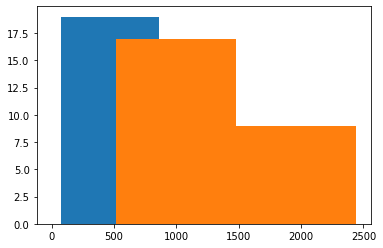

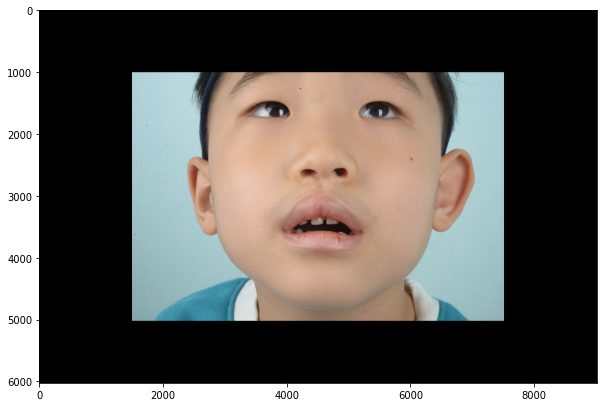

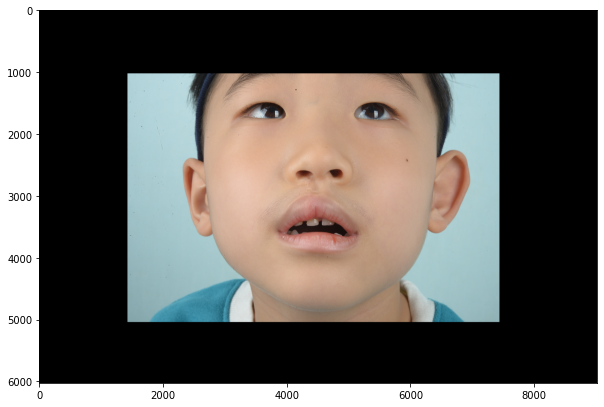

DSC_3584.JPG
1.0


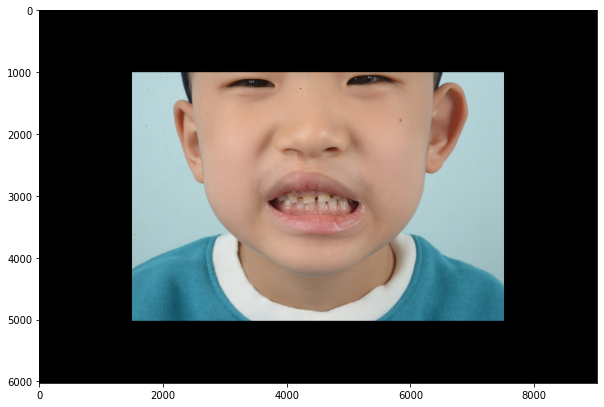

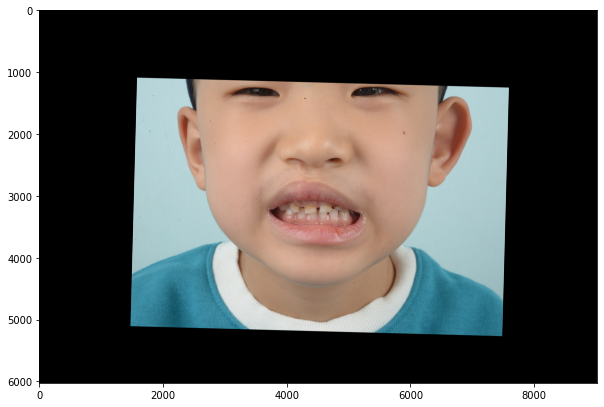

DSC_3569.JPG
1.0


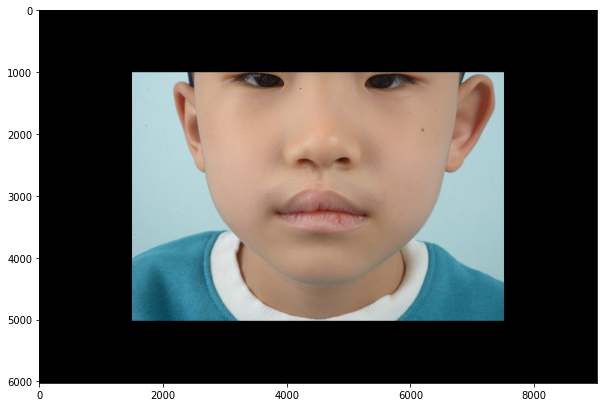

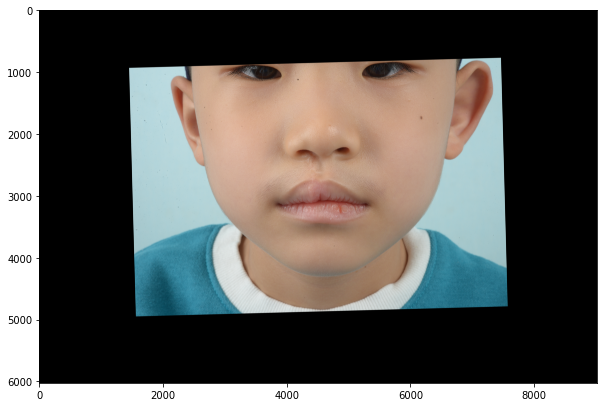

DSC_3586.JPG
1.0


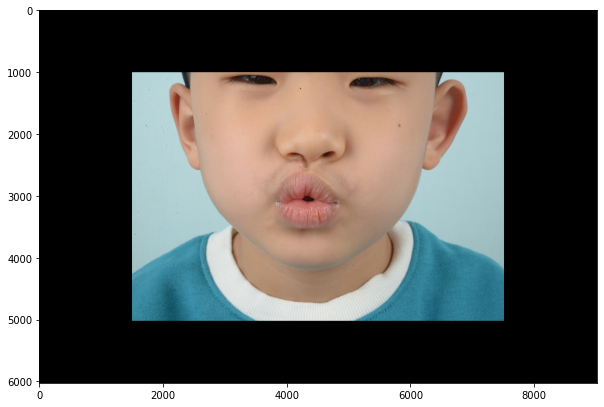

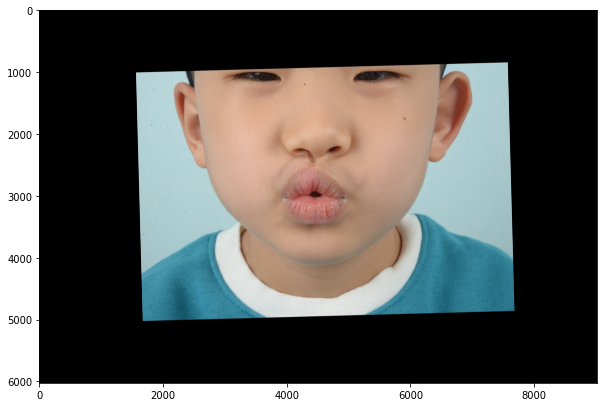

DSC_3583.JPG
1.0


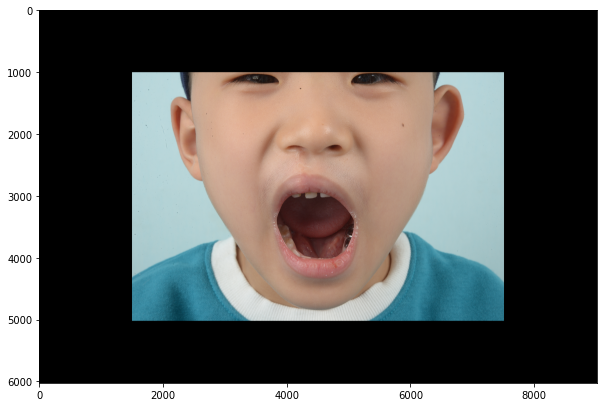

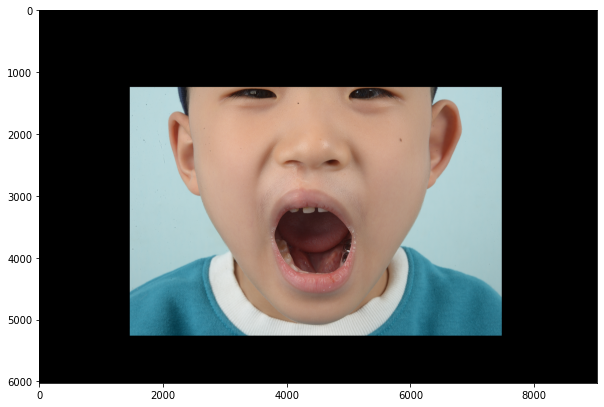

DSC_3574.JPG
1.0


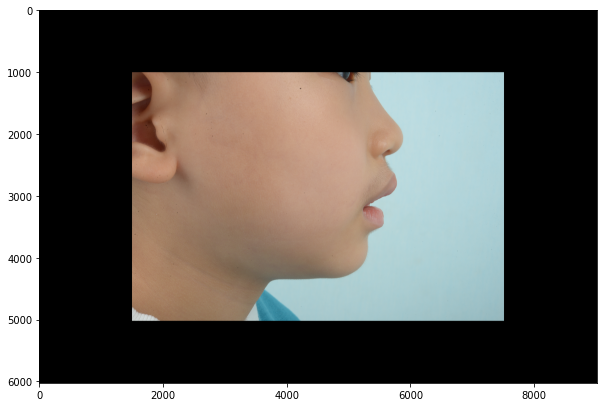

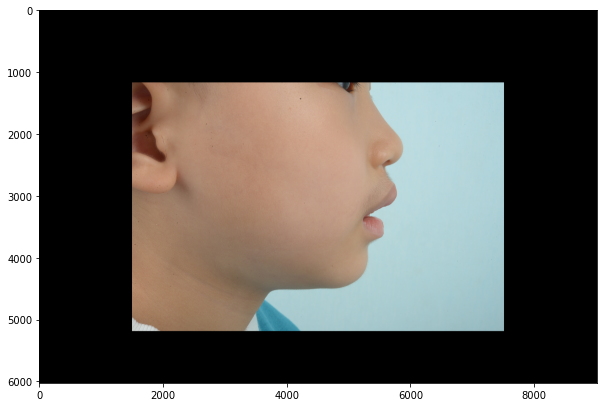

DSC_3571.JPG
1.0


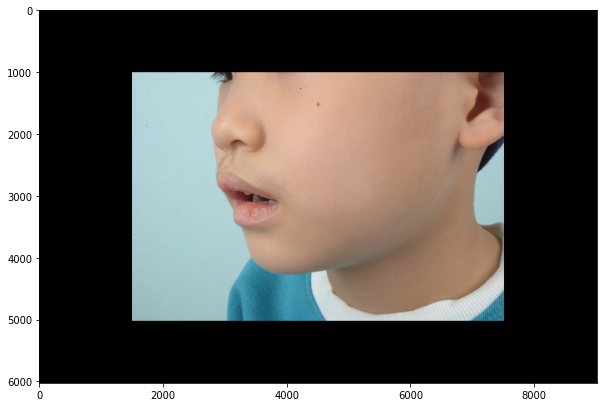

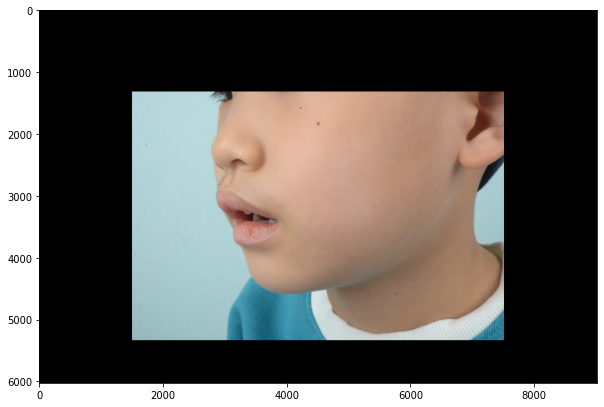

DSC_3572.JPG
1.0


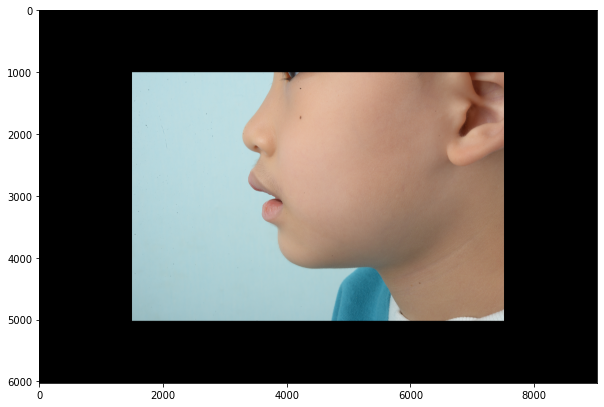

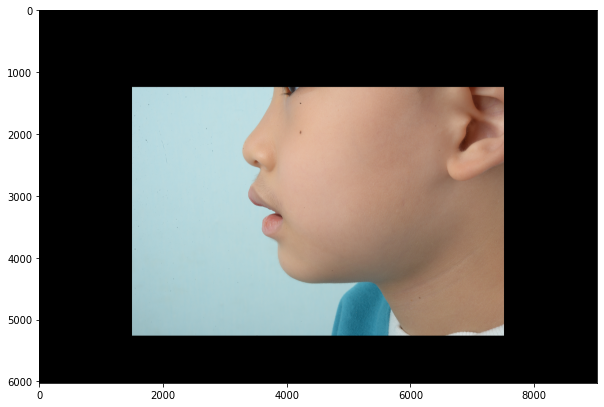

DSC_3573.JPG
1.0


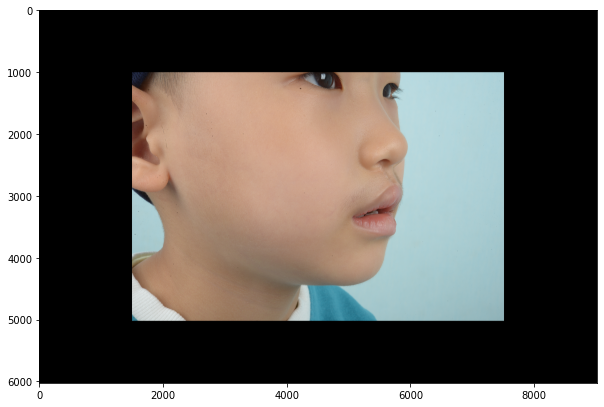

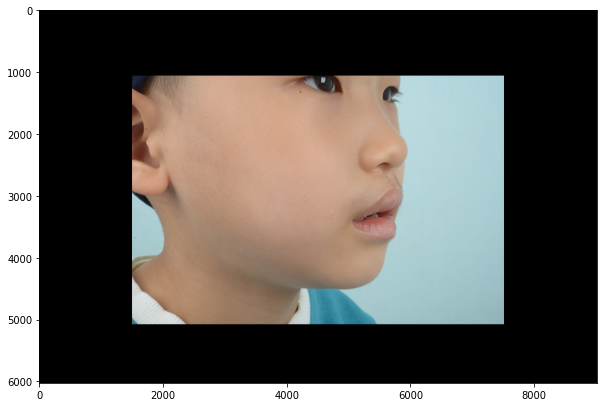

DSC_3570.JPG
1.0


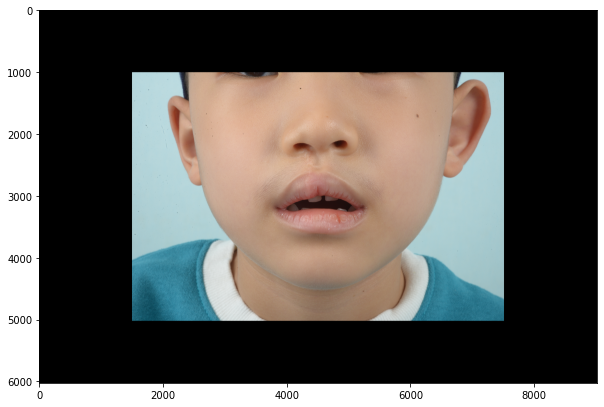

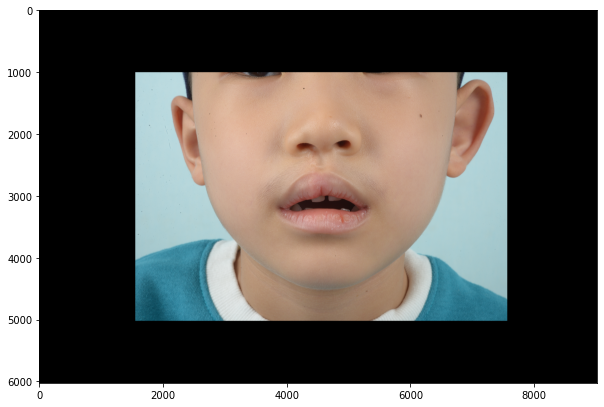

2990.0
90.5
3027.0
DSC_3576.JPG
1.0


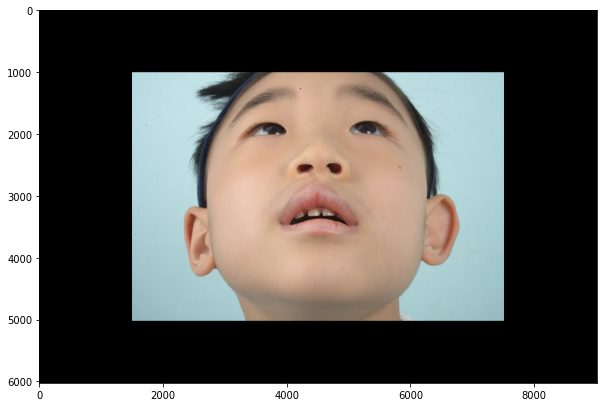

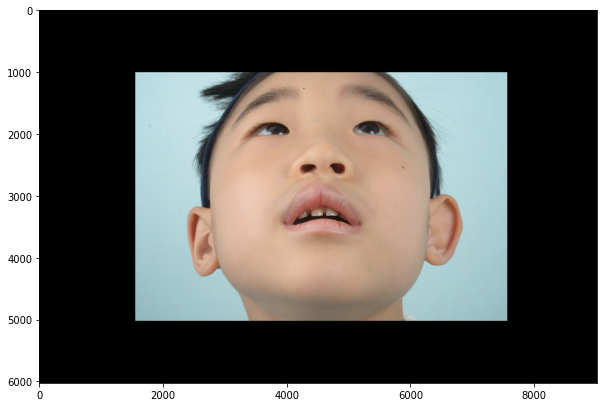

2990.0
90.5
3027.0
DSC_3578.JPG
1.0


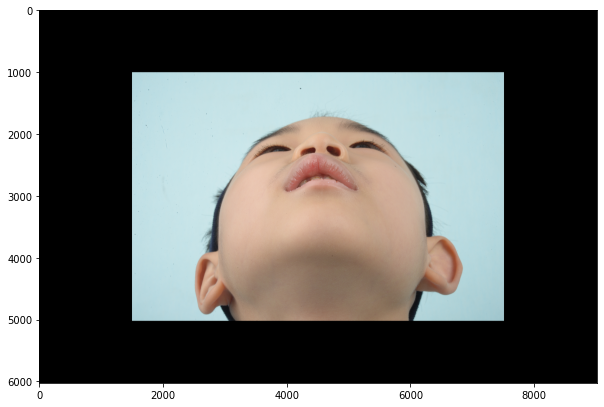

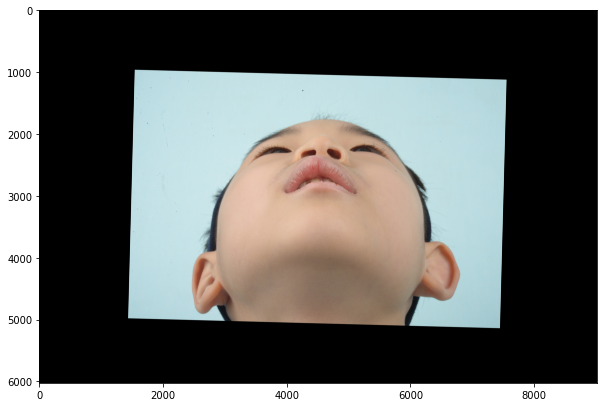

2990.0
90.5
3064.0
DSC_3577.JPG
1.0


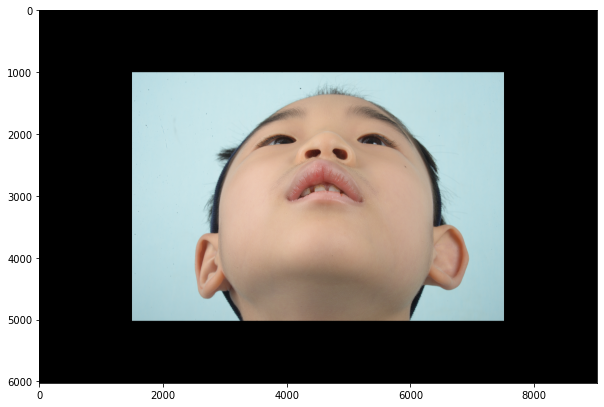

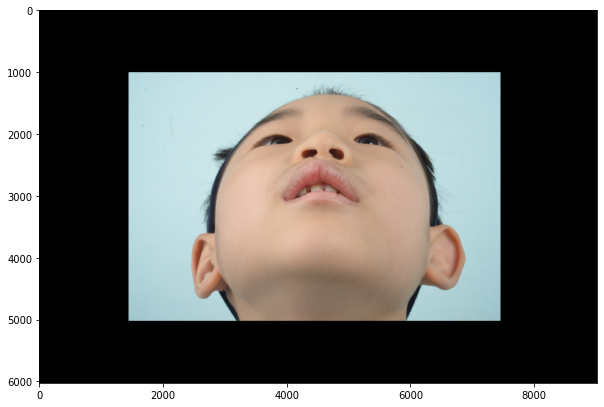

2990.0
90.5
3137.0
ref_key DSC_3557.JPG
=========dir_type=========
origin
=========dir_type=========
horizontal
=========dir_type=========
vertical
DSC_3557.JPG
1.0


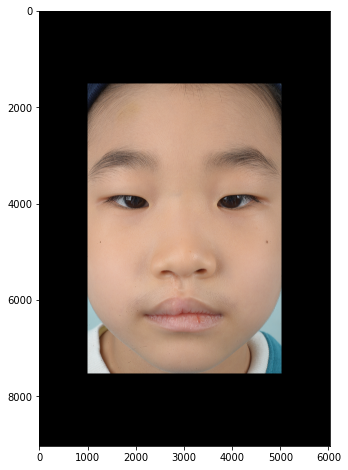

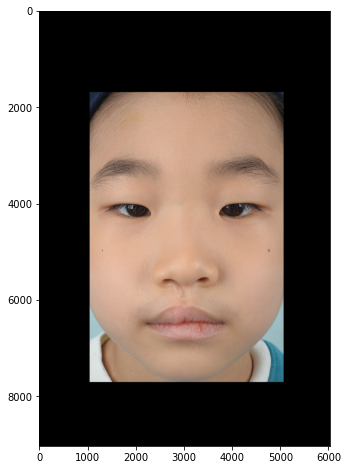

DSC_3565.JPG
1.0


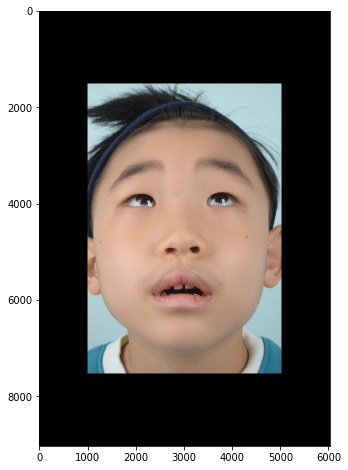

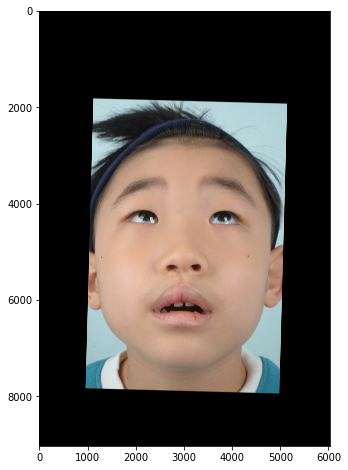

DSC_3558.JPG
1.0


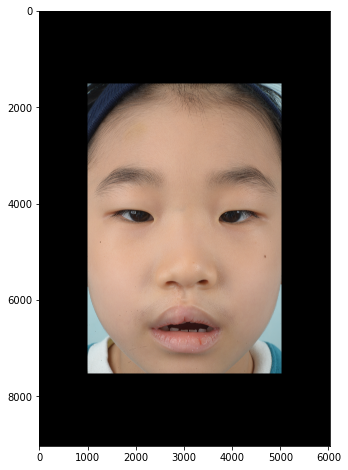

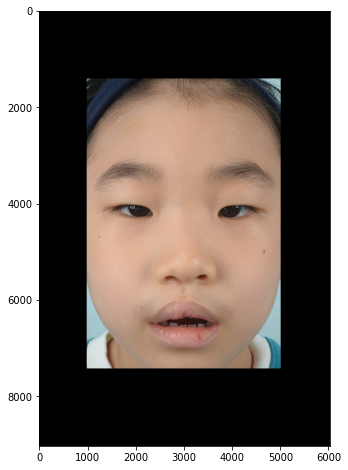

DSC_3561.JPG
1.0


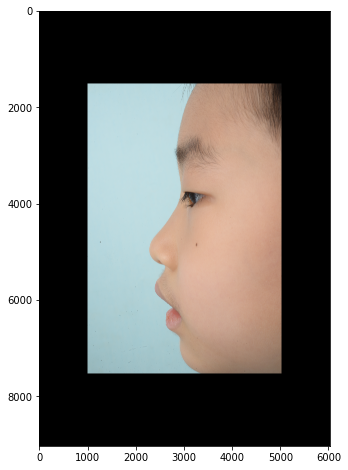

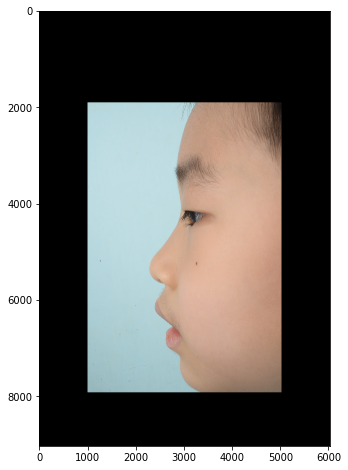

DSC_3560.JPG
1.0


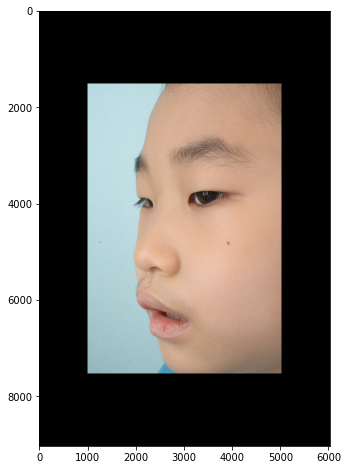

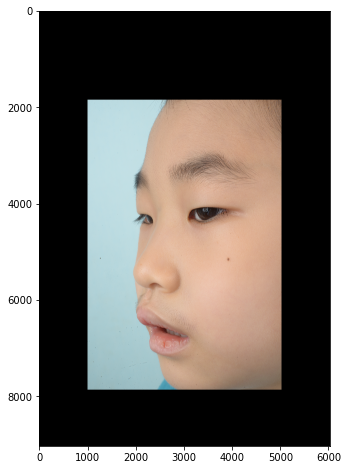

DSC_3564.JPG
1.0


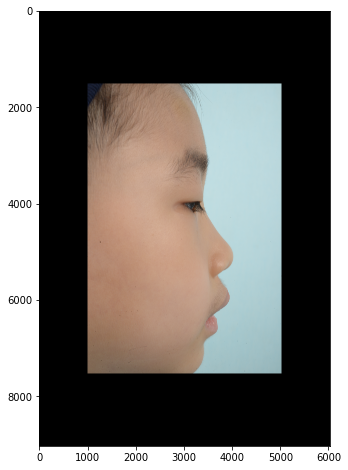

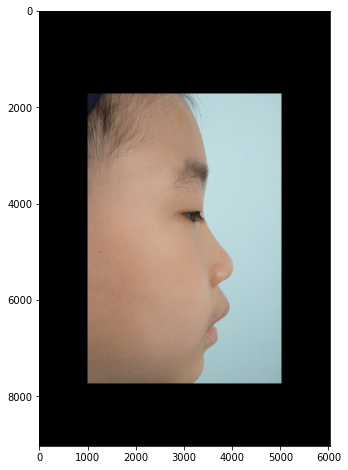

DSC_3563.JPG
1.0


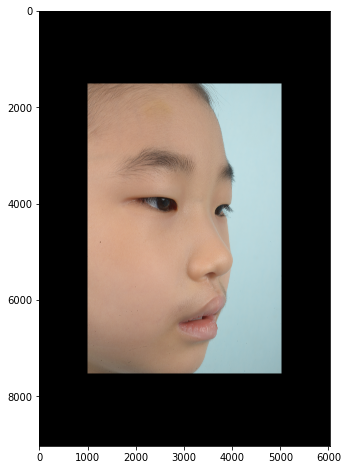

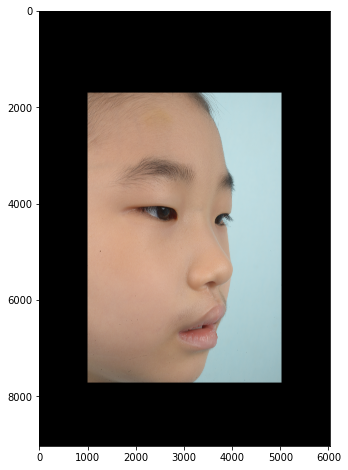

DSC_3567.JPG
1.0


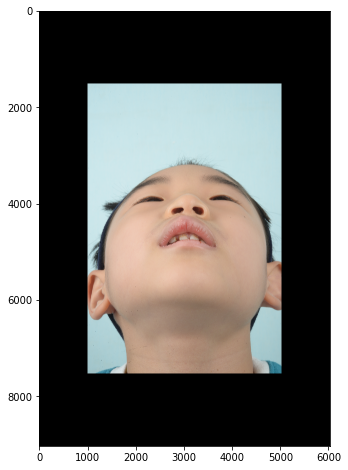

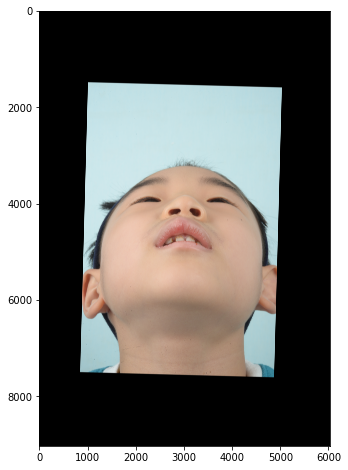

1916.5
79.3333740234375
2027.0
DSC_3568.JPG
1.0


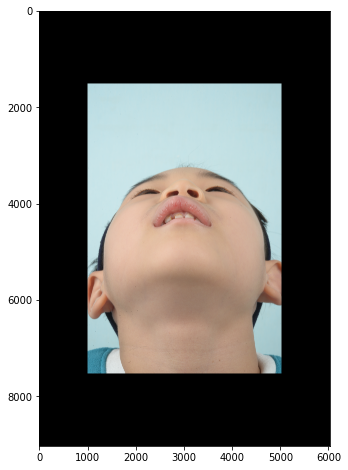

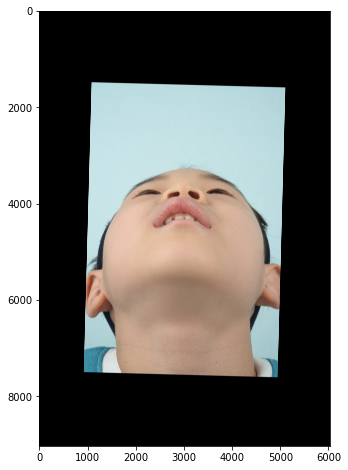

1916.5
79.3333740234375
1953.5
DSC_3566.JPG
1.0


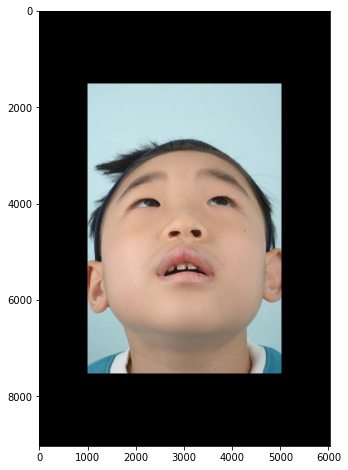

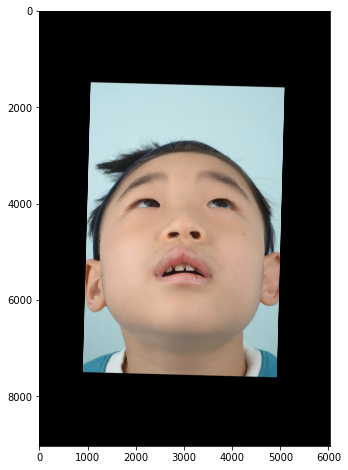

1916.5
79.3333740234375
1971.5
DSC_3589.JPG
1.0


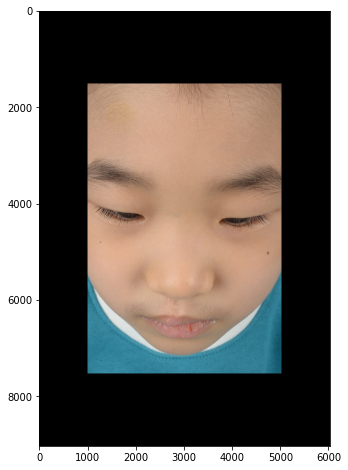

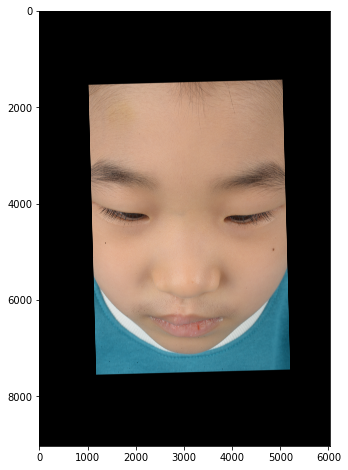

1916.5
79.3333740234375
1935.5
ref_key DSC_3579.JPG
=========dir_type=========
origin
=========dir_type=========
horizontal
=========dir_type=========
vertical
DSC_3581.JPG
1.0


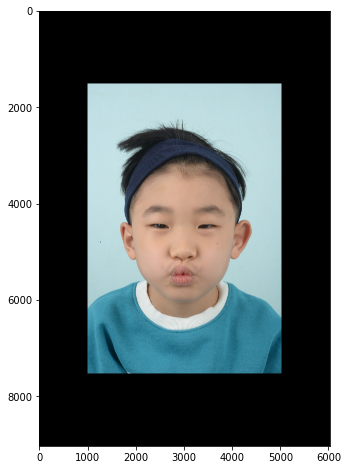

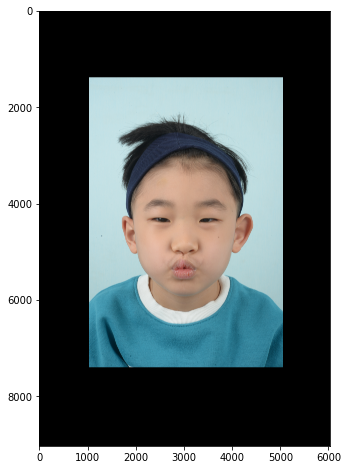

DSC_3580.JPG
1.0


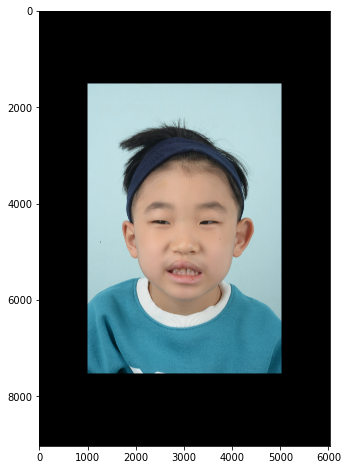

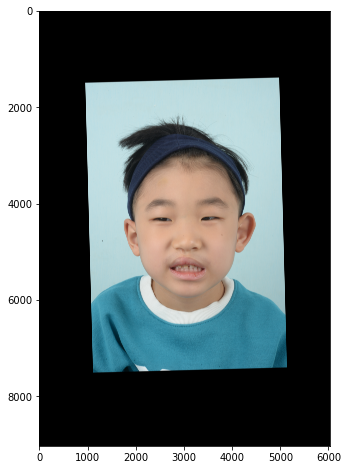

DSC_3548.JPG
1.0


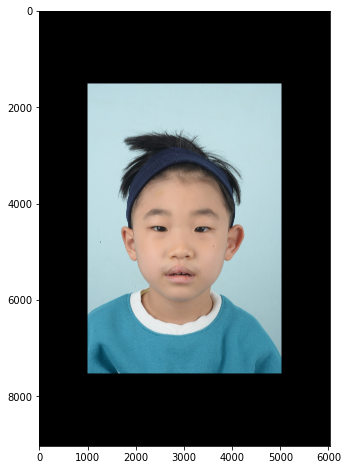

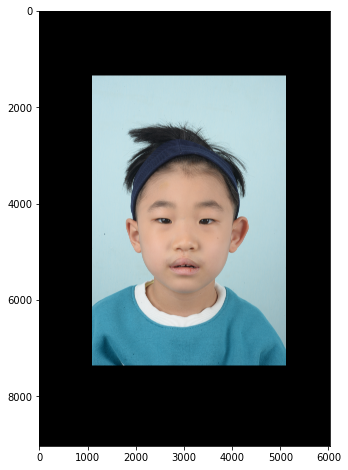

DSC_3582.JPG
1.0


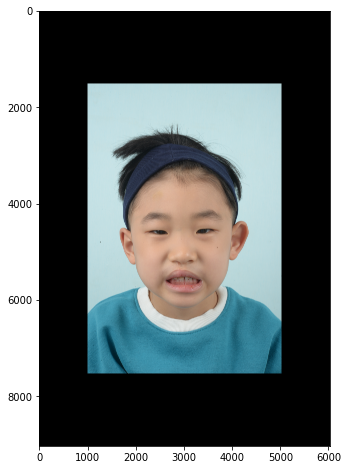

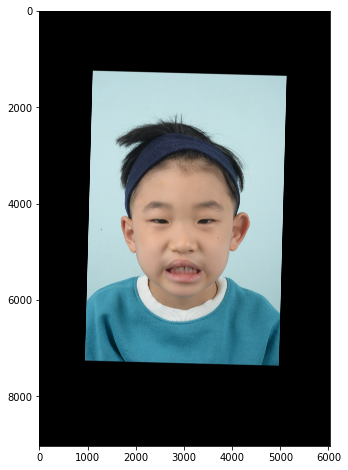

DSC_3579.JPG
1.0


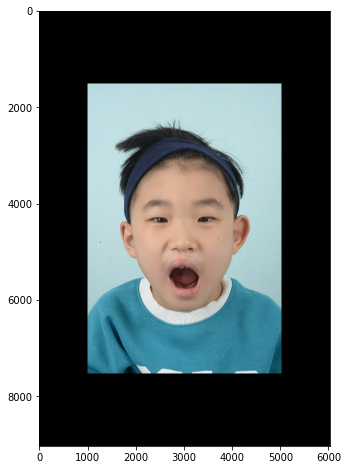

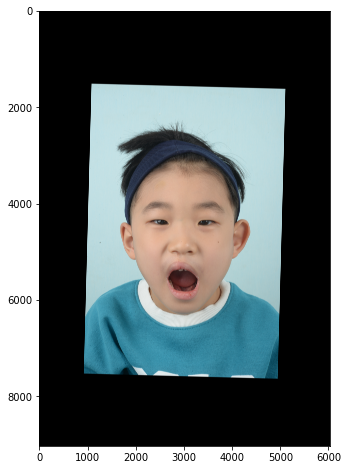

DSC_3547.JPG
1.0


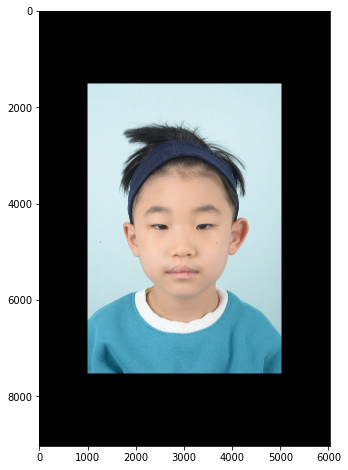

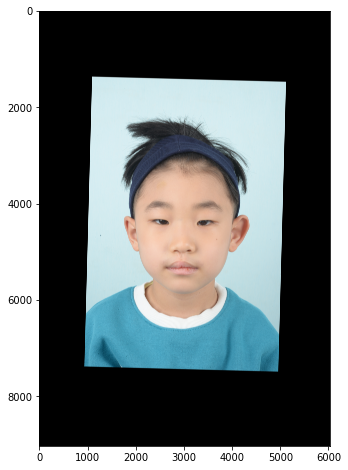

DSC_3550.JPG
1.0


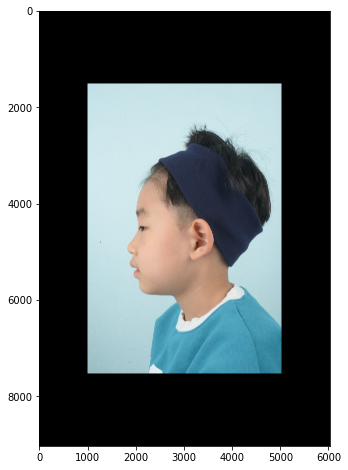

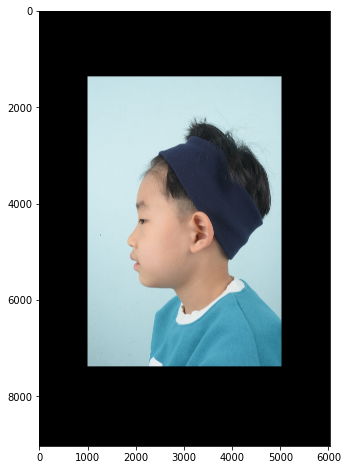

DSC_3551.JPG
1.0


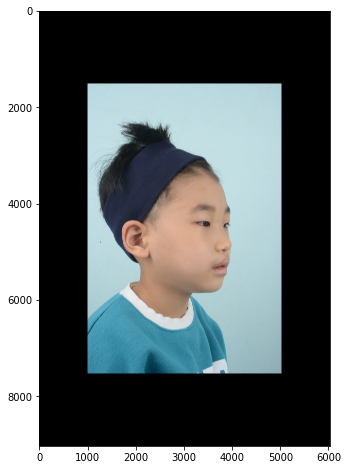

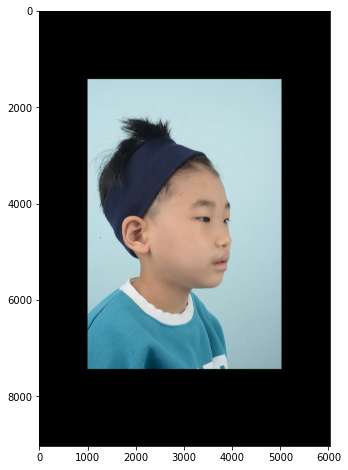

DSC_3549.JPG
1.0


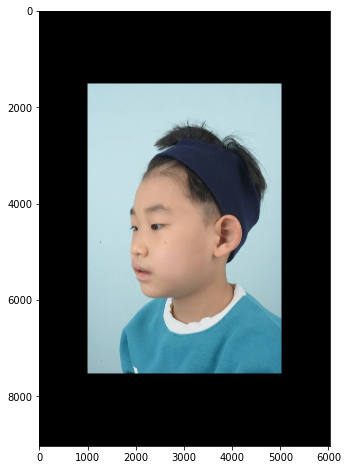

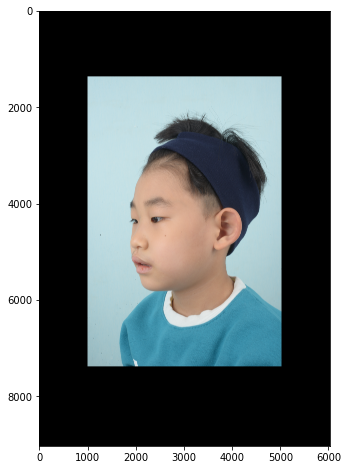

DSC_3552.JPG
1.0


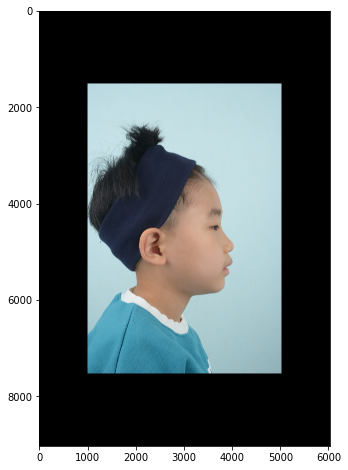

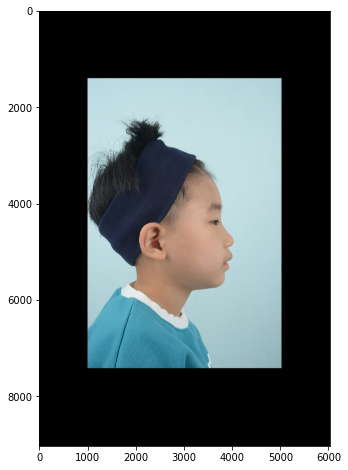

DSC_3555.JPG
1.0


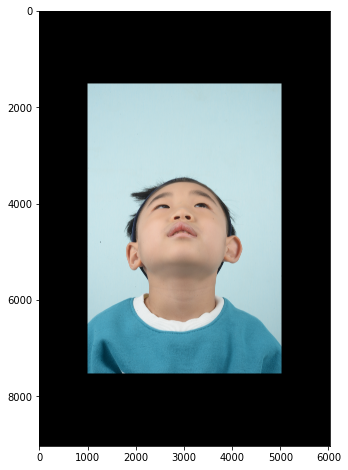

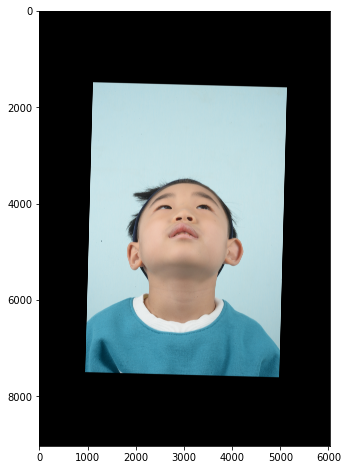

1935.0
91.3333740234375
1953.5
DSC_3554.JPG
1.0


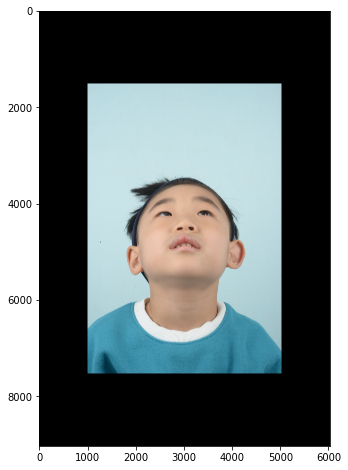

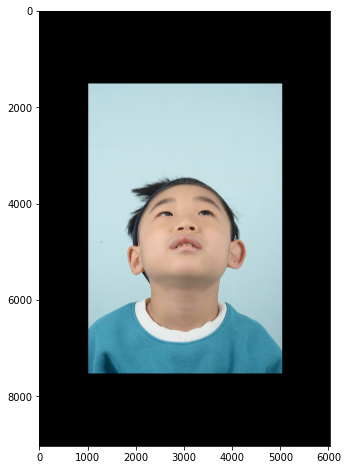

1935.0
91.3333740234375
2008.5
DSC_3556.JPG
1.0


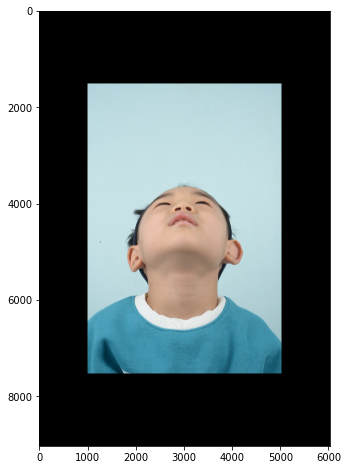

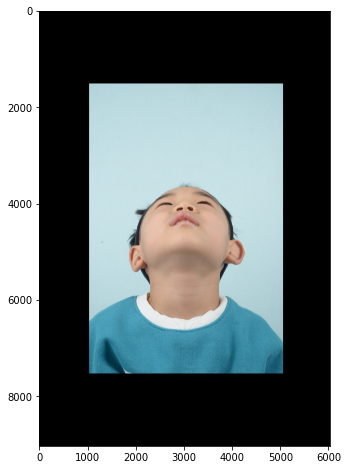

1935.0
91.3333740234375
1990.0
DSC_3588.JPG
1.0


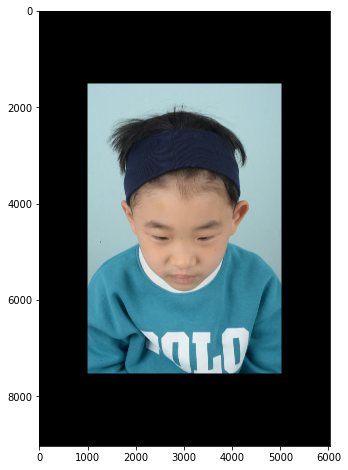

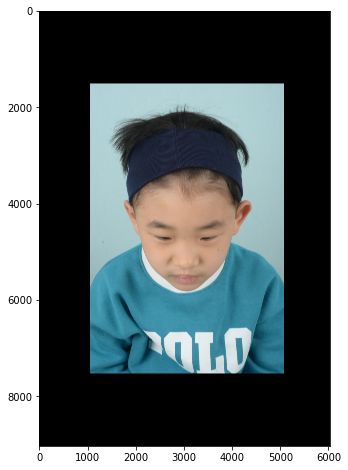

1935.0
91.3333740234375
1971.5
DSC_3553.JPG
1.0


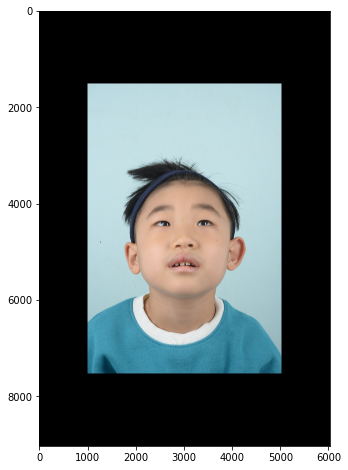

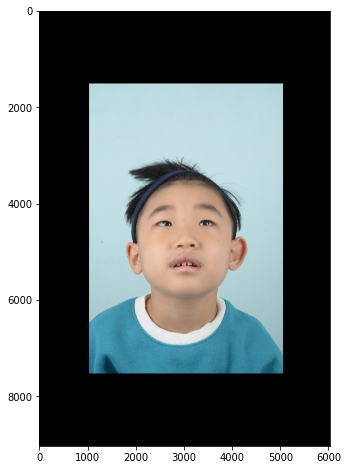

1935.0
91.3333740234375
1990.5


In [22]:
#landscape_split_d/ zoom_in_split_d/ zoom_out_split_d
model = get_model_by_name('AFLW')
imgs_dict = get_lmks_with_dicts(model, img_paths)

#generate "landscape/ zoom_in/ zoom_out"
landscape, zoom_in, zoom_out = sort_imgs_to_set(imgs_dict)

#generate "origin/ horizontal/ vertical"
landscape, zoom_in, zoom_out = sort_all_sets_to_dirtype(landscape, zoom_in, zoom_out) 

edit_all_images(landscape, "nose")
edit_all_images(zoom_in, "eye")
edit_all_images(zoom_out, "eye")

In [23]:
def view_results(target_d, dir_type):
    for k in target_d[dir_type].keys():
        target = target_d[dir_type][k]
        print(k)

        plt.figure(figsize=(10,8))
        plt.imshow(target["img"])
        plt.show()

        plt.figure(figsize=(10,8))
        plt.imshow(target["crop_img"])
        plt.show()

DSC_3575.JPG


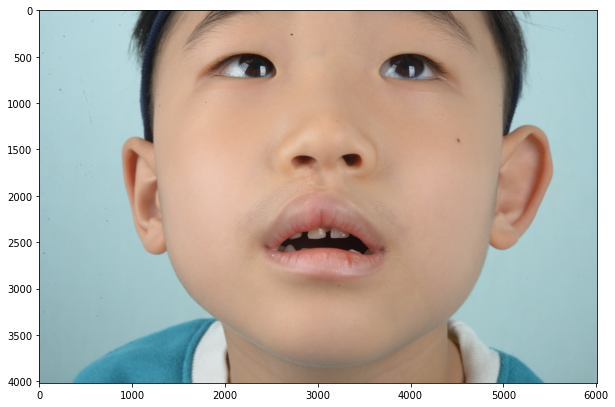

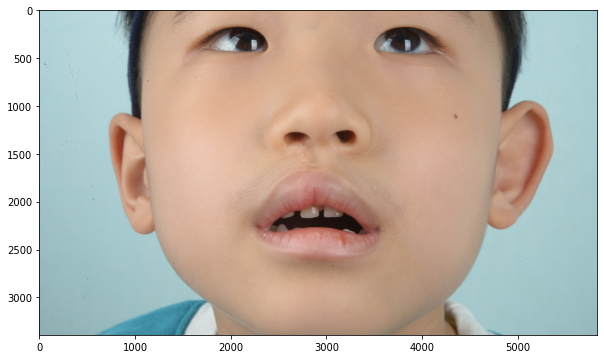

DSC_3584.JPG


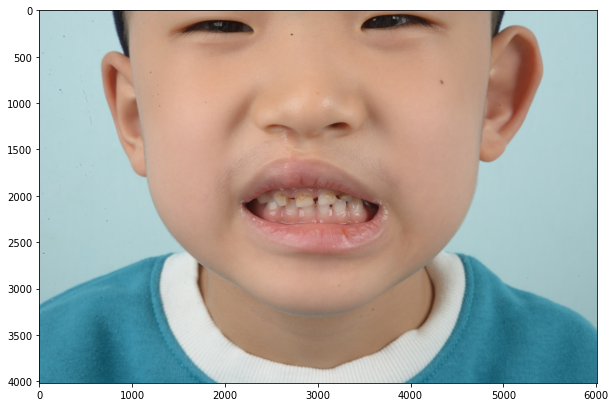

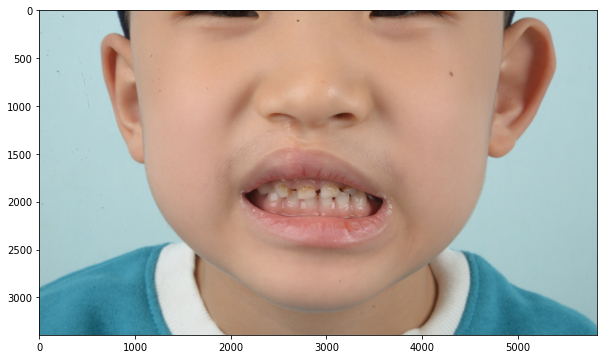

DSC_3569.JPG


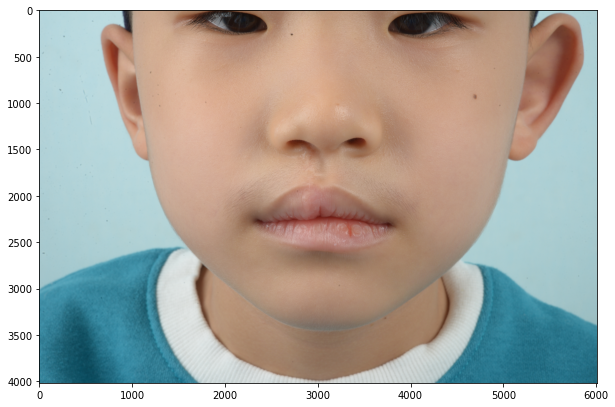

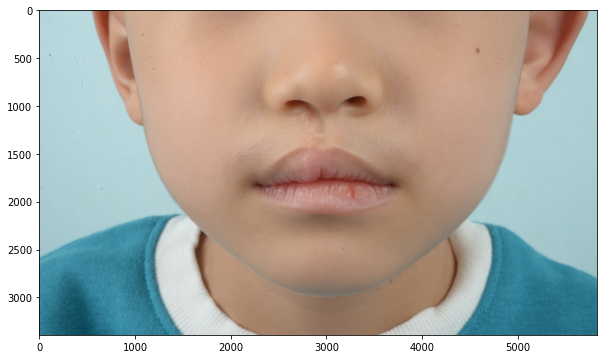

DSC_3586.JPG


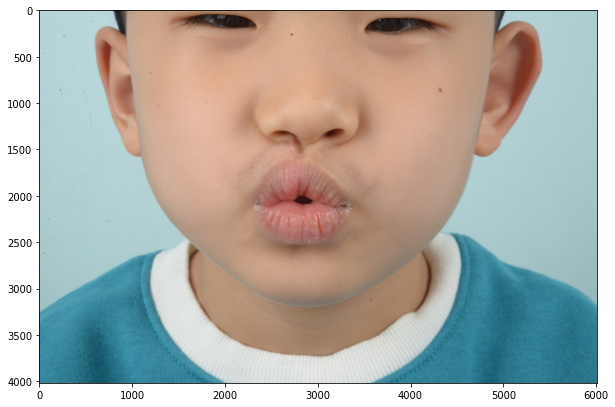

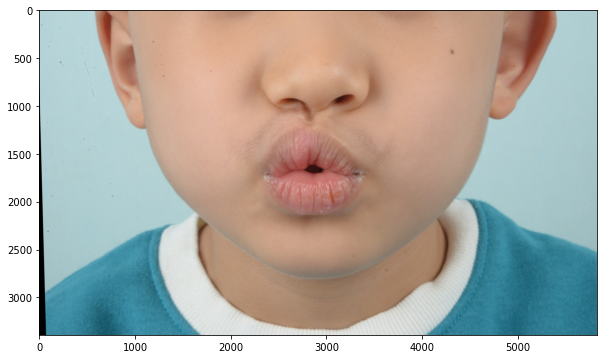

DSC_3583.JPG


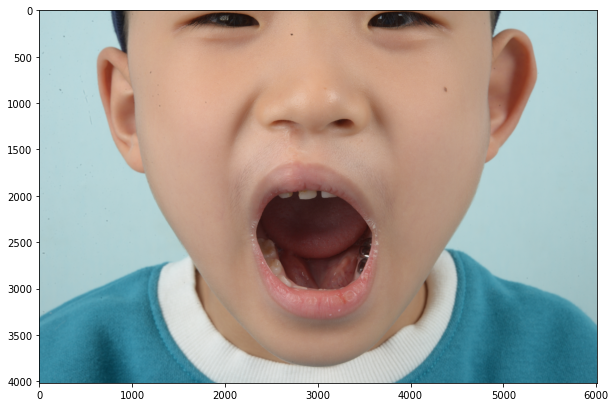

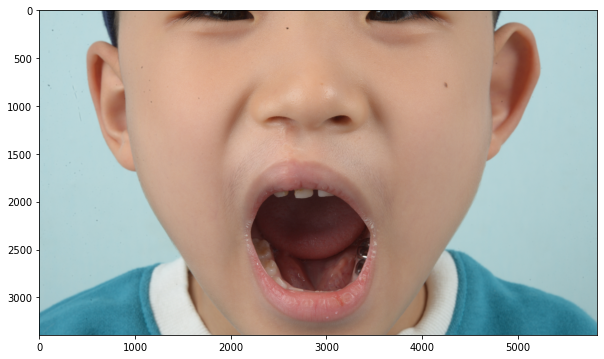

DSC_3574.JPG


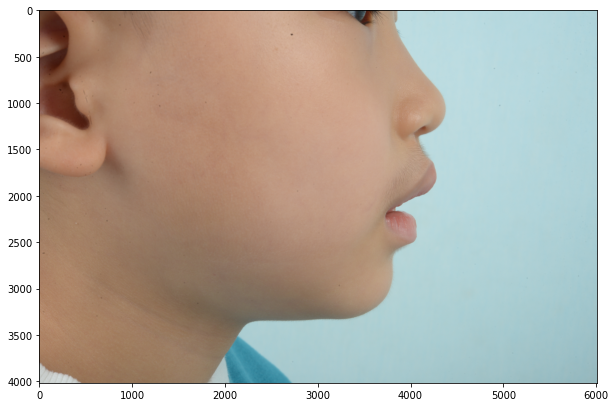

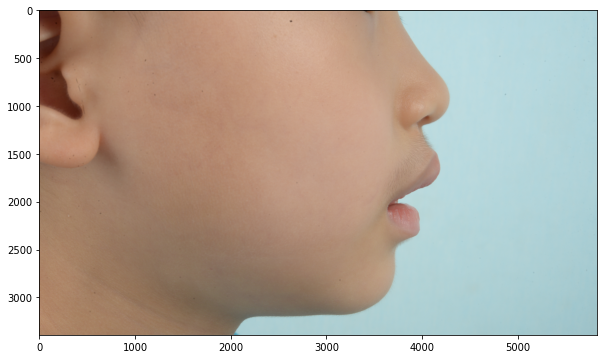

DSC_3571.JPG


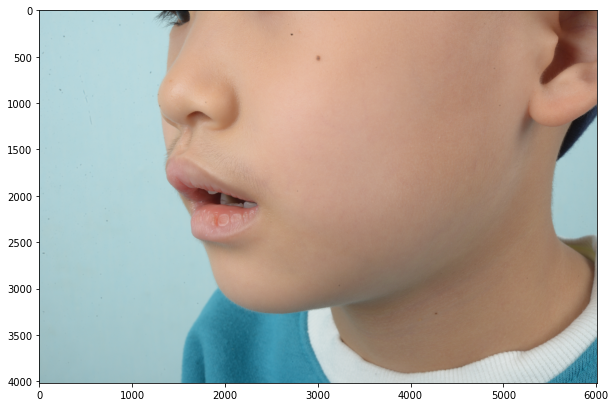

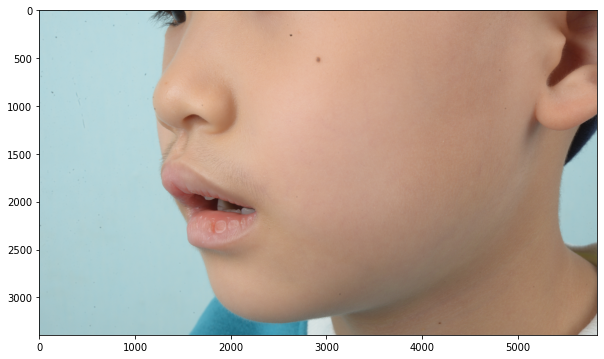

DSC_3572.JPG


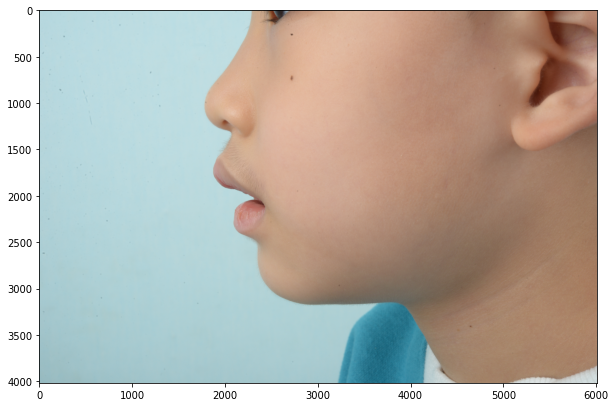

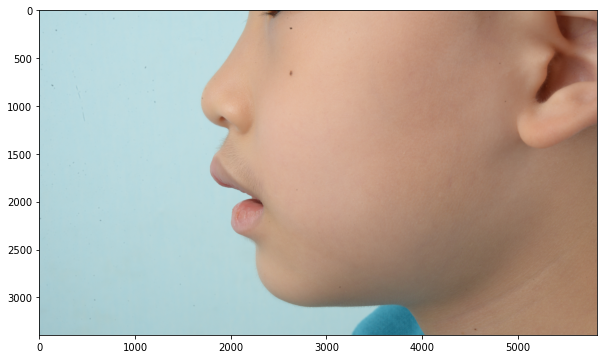

DSC_3573.JPG


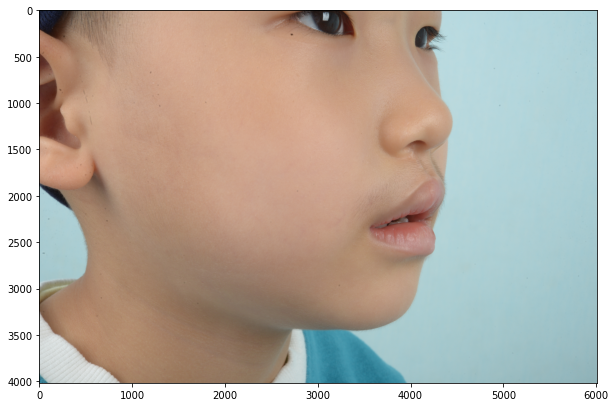

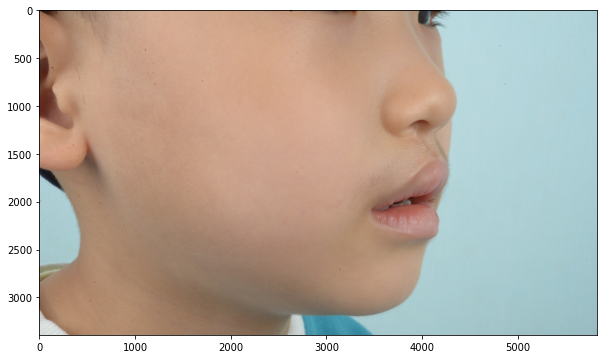

DSC_3570.JPG


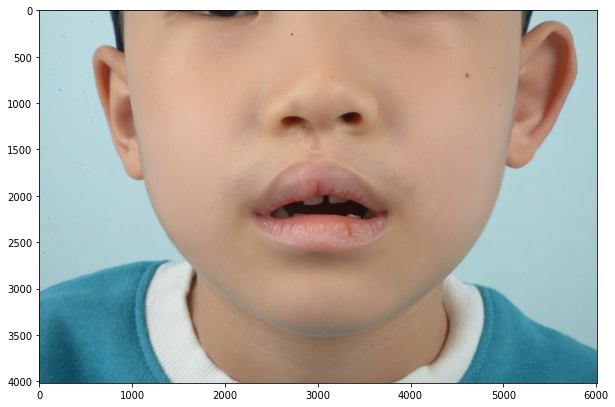

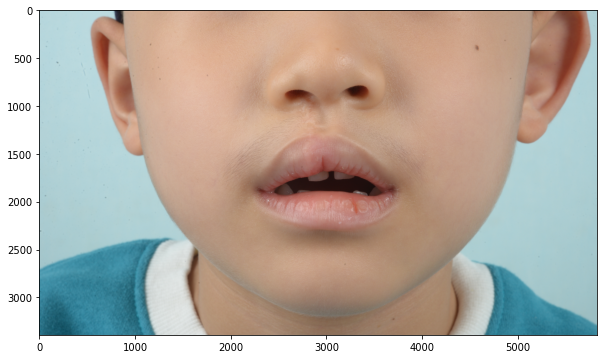

DSC_3576.JPG


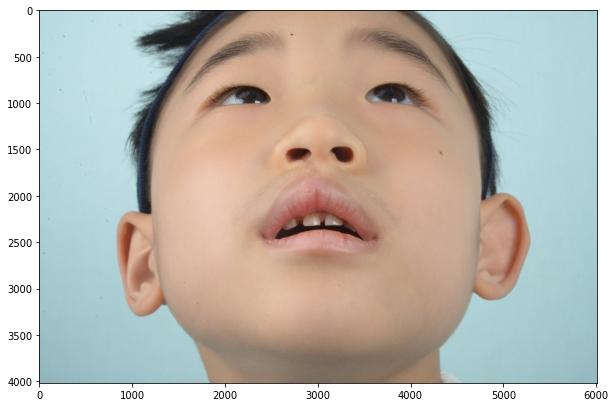

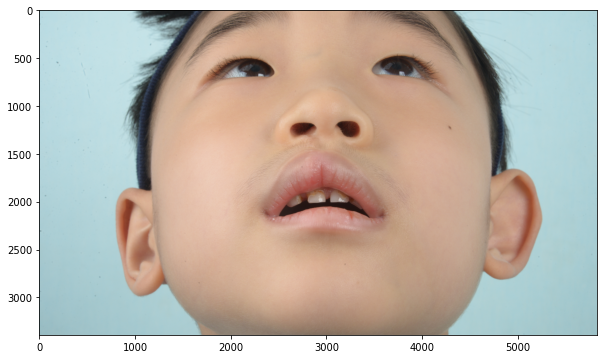

DSC_3578.JPG


In [ ]:
view_results(landscape, "origin")
view_results(landscape, "horizontal")
view_results(landscape, "vertical")

In [ ]:
view_results(zoom_in, "origin")
view_results(zoom_in, "horizontal")
view_results(zoom_in, "vertical")

In [ ]:
view_results(zoom_out, "origin")
view_results(zoom_out, "horizontal")
view_results(zoom_out, "vertical")

In [27]:
def save_images(path, target_dicts, dir_path="landscape"):
    
    _dir_path = ospj(path,"edit")
    if not os.path.exists(_dir_path):
        os.mkdir(_dir_path)
    
    
    dir_path = ospj(_dir_path,dir_path)
    if not os.path.exists(dir_path):
        os.mkdir(dir_path)
    
    group_l = ["origin", "vertical", "horizontal"]
    for group in group_l:
        for k in target_dicts[group].keys():
            target = target_dicts[group][k]
            cv2.imwrite(ospj(dir_path, str(k)),cv2.cvtColor(target["crop_img"], cv2.COLOR_BGR2RGB))
    
  


In [ ]:
save_images(path, landscape, dir_path="landscape")

In [ ]:
save_images(path, zoom_in, dir_path="zoom_in")

In [ ]:
save_images(path, zoom_out, dir_path="zoom_out")